# **Introducción a las GAN Convolucionales Profundas**
  - Deep Convolutional Generative Adversarial Networks -




# **OBJETIVO GENERAL:**

- Introducción a las DCGAN a través de un ejemplo, entrenando una Red Generativa Adversarial (GAN) para generar nuevas imagenes(celebridades) después de mostrarle imágenes de muchas celebridades.

- Este caso de uso es una introducción a las GAN Convolucionales Profundas, poporcionando una explicación intuitiva de lo que son las GANs y cómo construir un GAN. Para hacerlo sencillo se ha utilizado el conjunto de datos Anime Face que contiene imágenes de caras de personajes de dibujos animados.

***- CONTENIDO:***

1.  ¿Qué es una GANs?
2.  Estructura general de una GANs
3.  Aspecto general de una GANs
4.  Praparación
5.  Importacion de Bibliotecas y componentes
6.  Definición de Variables
7.  El DataSet
8.  Visualización de las imagenes para entrenamiento
9.  Implementación
10. Inicialización de pesos
11. Generador
12. Discriminador
13. Oprtimizadores y funciones Loss
14. Entrenamiento (Parte1: Discriminador; Parte2: Generador)
15. Resultados (Loss vs iteración de entrenamiento, Visualizacion de las progresiones G's, Imagenes reales vs imagenes "Fakes")





### Alcance

- Este caso de uso es una introducción a las GAN Convolucionales Profundas.
- Se considera una explicación intuitiva de lo que son los GANs y cómo construir una GAN.
- Para hacerlo sencillo, se  ha utilizado el conjunto de datos Anime Face que contiene imágenes de caras de personajes de dibujos animados.

## Objetivos:
   * Demostrar y explicar el funcionamiento de un GAN.
   * Demostrar cómo construir y entrenar un GAN con pytorch.


# DC-GAN

**Paper: Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks**

**Link: https://arxiv.org/abs/1511.06434**

**Authors: Alec Radford, Luke Metz, Soumith Chintala**

## Abstract

- En los últimos años, el aprendizaje supervisado con redes convolucionales (CNN) ha experimentado una enorme adopción en las aplicaciones de visión por ordenador.
- En comparación, el aprendizaje no supervisado con CNNs ha recibido menos atención. En este trabajo esperamos ayudar a salvar la brecha entre el éxito de las CNNs para el aprendizaje supervisado y el aprendizaje no supervisado.
Se introduce una clase de CNNs llamadas redes generativas adversariales convolucionales profundas (DCGANs), que tienen ciertas restricciones arquitectónicas, y demostramos que son un fuerte candidato para el aprendizaje no supervisado.
- Entrenando en varios conjuntos de datos de imágenes, se muestra (en el articulo) pruebas convincentes de que el par adversarial convolucional profundo aprende una jerarquía de representaciones desde las partes del objeto hasta las escenas, tanto en el generador como en el discriminador.
- Además, se utiliza las características aprendidas para tareas novedosas, demostrando su aplicabilidad como representaciones generales de imágenes.



***REF:***

- https://arxiv.org/pdf/1511.06434.pdf
- https://github.com/aniketmaurya/pytorch-gans/blob/main/DCGAN/dcgan.
ipynb
- https://www.davidinouye.com/course/ece57000-fall-2019/lectures/lec12-dcgans.pdf
- https://www.kaggle.com/code/abhranta/dcgan
- DCGAN TUTORIAL. Nathan Inkawhich.  https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html



# **INTRODUCCIÓN**

## Introduction

- Este caso de uso ofrece una introducción a los DCGAN a través de un ejemplo. Se entrenaremos una red generativa adversarial (GAN) para generar celebridades después de mostrarle fotos de muchas celebridades reales. Para la mayor parte el código, se ha considerado como referencia el correspondiente a la implementación DCGAN en
[pytorch/examples](https://github.com/pytorch/examples)_, y permite visualzar cómo y por qué funciona este modelo.

## Generative Adversarial Networks

### What is a GAN?

- Las GAN son un "framework" para enseñar a un modelo de aprendizaje profundo a capturar la distribución de los datos de entrenamiento para que podamos generar nuevos datos a partir de esos mismos datos. entrenamiento para poder generar nuevos datos a partir de esa misma
distribución.
- Ian Goodfellow inventó los GAN en 2014 y los describió por primera vez en el documento describen en el artículo [Generative Adversarial Nets](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf)_.
Se componen de dos modelos distintos, un *generador* y un *discriminador*.
- El trabajo del generador es generar imágenes "falsas" que se parezcan a las imágenes de entrenamiento. se parezcan a las imágenes de entrenamiento.
- El trabajo del discriminador es mirar una imagen y determinar si es una imagen de entrenamiento real o una imagen falsa del generador.
-  Durante el entrenamiento, el generador intenta constantemente burlar al discriminador generando cada vez mejores falsificaciones, mientras que el discriminador trabaja para convertirse en un mejor detective y clasificar correctamente las imágenes reales y falsas.
- El equilibrio de este juego se produce cuando el generador genera falsificaciones perfectas que parecen sacadas directamente de los datos de entrenamiento, y el discriminador tiene que adivinar siempre, con un 50% de confianza, si la salida del generador es real o falsa.

- Ahora, se definirá algunas notaciones que se utilizarán a lo largo del tutorial comenzando por con el discriminador.
- Sea $x$ un dato que representa una imagen.
- $D(x)$ es la red discriminante que produce la probabilidad (escalar)
probabilidad de que $x$ proceda de los datos de entrenamiento y no del
generador.
- Como se trata de imágenes, la entrada de $D(x)$ es una imagen de tamaño CHW 3x64x64. Intuitivamente, $D(x)$ debe ser ALTO cuando $x$ proviene de los datos de entrenamiento y BAJO cuando $x$ proviene del generador. $D(x)$ también puede considerarse como un clasificador binario tradicional.

- Para la notación del generador, sea $z$ un vector del espacio latente
muestreado a partir de una distribución normal estándar. $G(z)$ representa la función función generadora que asigna el vector latente $z$ al espacio de datos.
- El objetivo de $G$ es estimar la distribución que los datos de entrenamiento entrenamiento ($p_{data}$) para poder generar muestras falsas de esa esa distribución estimada ($p_g$).

- $D(G(z))$ es la probabilidad (escalar) de que la salida del
generador $G$ sea una imagen real.
-Como se describe en el articulo  [Goodfellow’s
paper](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf)_, $D$ and $G$ realizan un p´roecso ((juego) minimax en el que $D$ intenta
maximizar la probabilidad de que clasifique correctamente reales y falsos
($logD(x)$), y $G$ intenta minimizar la probabilidad de qu
$D$ predecirá que sus resultados son falsos ($log(1-D(G(z)))$).

- Según el artículo, la función de pérdida de GAN es  
>\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]\end{align}

- En teoría, la solución a este juego minimax es donde $p_g = p_{data}$, y el discriminador adivina al azar si el entradas son reales o falsas. Sin embargo, la teoría de convergencia de las GAN de convergencia de los GAN y, en realidad, los modelos no siempre se entrenan hasta este punto.

### What is a DCGAN?

- Una DCGAN es una extensión directa del GAN descrito anteriormente, excepto que utiliza explícitamente capas convolucionales y convolucionales-transpuestas en el discriminador y generador, respectivamente.
- Fue descrito por primera vez por Radford et. al. en el artículo [Unsupervised Representation Learning With Deep Convolutional Generative Adversarial Networks](https://arxiv.org/pdf/1511.06434.pdf)_.
- El discriminador se compone de strided [convolución](https://pytorch.org/docs/stable/nn.html#torch.nn.Conv2d)_capas, [batch norma](https://pytorch.org/docs/stable/nn.html#torch.nn.BatchNorm2d)_y[LeakyReLU](https://pytorch.org/docs/stable/nn.html#torch.nn.LeakyReLU)_activaciones.
- La entrada es una imagen de 3x64x64 y la salida es una probabilidad escalar de que la entrada pertenezca a la distribución de datos reales.
probabilidad escalar de que la entrada proceda de la distribución de datos reales.

- El generador se compone de capas [convolucionales-transpositivas](https://pytorch.org/docs/stable/nn.html#torch.nn.ConvTranspose2d)_
capas de norma de lote y activaciones [ReLU](https://pytorch.org/docs/stable/nn.html#relu)_.
- La entrada entrada es un vector latente, $z$, extraído de una distribución normal normal estándar y la salida es una imagen RGB de 3x64x64. Las capas permiten transformar el vector latente en un volumen con la misma forma que una imagen.
- En el artículo, los autores también  dan algunos consejos sobre cómo configurar los optimizadores funciones de pérdida y cómo inicializar los pesos del modelo, todo lo cual se describirá en las próximas secciones.




In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle/

In [ ]:
!cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!kaggle datasets download -d splcher/animefacedataset

In [ ]:
from zipfile import ZipFile

with ZipFile("/content/drive/MyDrive/DataSet/GANs/AnimaFaces.zip", "r") as zip:
    zip.extractall("animefacedataset")
    print("File is unzipped in temp folder")

File is unzipped in temp folder


In [ ]:
#!unzip animefacedataset -d '/content/AnimeFaces/'

#!unzip animefaces -d '/content/drive/MyDrive/DataSet/GANs/AnimaFaces.zip/'

<h1> DCGAN </h1>
 <h2>Deep Convolutional Generative Adversarial Network</h2>

<p>
<img src="https://raw.githubusercontent.com/znxlwm/pytorch-MNIST-CelebA-GAN-DCGAN/master/CelebA_DCGAN_crop_results/generation_animation.gif" >
</p>

## Q) Qué es una GAN ?

- Imaginar una situación en la que la persona A siempre miente a la persona B y la persona B intenta descubrir la mentira. Si continúan este juego durante mucho tiempo, al final la persona A se volverá muy buena mintiendo a la persona B y la persona B se volverá muy buena descubriendo las mentiras de la persona A.

- Si se nos ocurre alguna situación de este tipo en la que dos entidades estén continuamente intentando sacar ventaja compitiendo entre sí, entonces se podrá intuir cómo funcionan los GANS.

>> ***Las GANS son muy similar a la condideción señalada***



<h1>Overview of the GAN structure</h1>
<p>
A generative adversarial network (GAN) has two parts:

   * The generator learns to generate plausible data. The generated instances become negative training examples        for the discriminator.
    
   * The discriminator learns to distinguish the generator's fake data from real data. The discriminator penalizes      the generator for producing implausible results.

When the training begins, the generator produces obviously fake data, and the discriminator quickly learns to tell that it's fake:</p>
<p>
<img src="https://developers.google.com/machine-learning/gan/images/bad_gan.svg">
</p>

As the training progresses, the generator gets closer to producing output that can fool the discriminator:

<img src="https://developers.google.com/machine-learning/gan/images/ok_gan.svg">

Finally, if the generator training goes well, the discriminator gets worse at telling the difference between real and fake. It starts to classify fake data as real, and it's accuracy decreases. This means that the generator is getting good at producing fake data.

<img src="https://developers.google.com/machine-learning/gan/images/good_gan.svg">

## How does a GAN look ?

Well, here is a picture of the whole system:

<img src="https://developers.google.com/machine-learning/gan/images/gan_diagram.svg">

Both the generator and the discriminator are neural networks. The generator output is connected directly to the discriminator input. Through the process of backpropagation, the discriminator's classification provides a signal that the generator uses to update its weights.

Before diving any deeper into the workings of a GAN, let's get started with building it and we can understand as we proceed.

## Importación de componentes y Bibliotecas necesarias  

- En nuestro caso de uso, s eutiliza Pytorch (desarollado por Facebook.
- También se utiliza matplotlib para dibujar los gráficos de pérdidas, tqdm para monitorizar las épocas y PIL para preprocesar las imágenes.
- También se podría utilizar pandas en caso de que se desee almacenar los datos en un archivo csv.

In [ ]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset
import cv2
from PIL import Image
import numpy as np
from PIL import ImageFile
import csv
import matplotlib.animation as animation
from IPython.display import HTML
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch.nn.functional as F
from IPython.display import display
to_pil = torchvision.transforms.ToPILImage()
import random
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


### Let's define some variables:

   * <b>dataroot</b> - the path to the root of the dataset folder.
   * <b>workers</b> -the number of worker threads for loading the data with the DataLoader
   * <b>batch_size</b> - the batch size used in training. The DCGAN paper uses a batch size of 128
   * <b>image_size</b> - the spatial size of the images used for training.
   * <b>nc</b> - number of color channels in the input image. here we are using RGB images, hence nc = 3
   * <b>nz</b> - length of the latent vector
   * <b>ngf</b> - relates to the depth of the feature maps carried through the generator
   * <b>ndf</b> - sets the depth of feature maps propagated through the discriminator
   * <b>num_epochs</b> - number of training epochs to run. Training for longer will lead to better results but it will take a lot of time.
   * <b>lr</b> - learning rate for training. As described in the DCGAN paper this should be 0.0002
   * <b>beta1</b> - beta1 hyperparametter for Adam optimizer. As described in the DCGAN paper this should be 0.5
   * <b>ngpu</b> - number of GPUs available. If this is 0, code will run in CPU mode.

Let’s define some inputs for the run:

-  ``dataroot`` - the path to the root of the dataset folder. We will
   talk more about the dataset in the next section.
-  ``workers`` - the number of worker threads for loading the data with
   the ``DataLoader``.
-  ``batch_size`` - the batch size used in training. The DCGAN paper
   uses a batch size of 128.
-  ``image_size`` - the spatial size of the images used for training.
   This implementation defaults to 64x64. If another size is desired,
   the structures of D and G must be changed. See
   [here](https://github.com/pytorch/examples/issues/70)_ for more
   details.
-  ``nc`` - number of color channels in the input images. For color
   images this is 3.
-  ``nz`` - length of latent vector.
-  ``ngf`` - relates to the depth of feature maps carried through the
   generator.
-  ``ndf`` - sets the depth of feature maps propagated through the
   discriminator.
-  ``num_epochs`` - number of training epochs to run. Training for
   longer will probably lead to better results but will also take much
   longer.
-  ``lr`` - learning rate for training. As described in the DCGAN paper,
   this number should be 0.0002.
-  ``beta1`` - beta1 hyperparameter for Adam optimizers. As described in
   paper, this number should be 0.5.
-  ``ngpu`` - number of GPUs available. If this is 0, code will run in
   CPU mode. If this number is greater than 0 it will run on that number
   of GPUs.



In [ ]:
# Root directory for dataset
#dataroot = "/content/AnimeFaces"
dataroot = "/content/animefacedataset"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

## Data

- En esta versión del caso de uso, se utiliza el DataSet AnimeFaces, el cual se descarga de kaggle y se descomprime en el tiempo de ejecución de google colab.
- La estructura del directorio es:
<b>
<div class="highlight-default notranslate"><div class="highlight"><pre><span></span><span class="n">/</span><span class="o">content</span><span class="n">/</span><span class="o">AnimeFaces</span>
    <span class="o">-&gt;</span> <span class="n">images</span>
        <span class="o">-&gt;</span> <span class="mf">188242.</span><span class="n">jpg</span>
        <span class="o">-&gt;</span> <span class="mf">173822.</span><span class="n">jpg</span>
        <span class="o">-&gt;</span> <span class="mf">284702.</span><span class="n">jpg</span>
        <span class="o">-&gt;</span> <span class="mf">537394.</span><span class="n">jpg</span>
           <span class="o">...</span>
</pre></div>
</div></b>

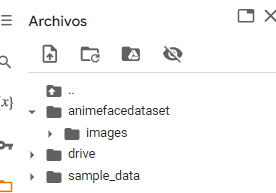


This is an important step because we will be using the <b>ImageFolder</b> dataset class, which requires there to be subdirectories in the dataset’s root folder. Now, we can create the dataset, create the dataloader, set the device to run on, and finally visualize some of the training data.

<b>Se utilizará las siguientes transformaciones en las imágenes:</b>
   * Redimension de las imágenes a 64x46 imágenes.
   * Convertir las imágenes en tensores de antorcha.
   * Normalizar los valores de los píxeles para que estén entre -1 y 1, ya que ese es el rango de la función Tanh().

***DATA ALTERNATIVA:***




-  [Celeb-A Faces
dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)_ which can
be downloaded at the linked site, or in [Google
Drive](https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg)_.

- El conjunto de datos se descargará como un archivo llamado ``img_align_celeba.zip``. Una vez descargado
descargado, cree un directorio llamado ``celeba`` y extraiga el archivo zip
en ese directorio. A continuación, establece la entrada ``dataroot`` para este cuaderno en el directorio ``celeba`` que acabas de crear. El directorio resultante resultante debe ser:

   /path/to/celeba
       -> img_align_celeba  
           -> 188242.jpg
           -> 173822.jpg
           -> 284702.jpg
           -> 537394.jpg
              ...



In [ ]:
#Defining the transformations to be applied on the images
transform = transforms.Compose([
    transforms.Resize((64 , 64)) ,
    transforms.ToTensor() ,
    transforms.Normalize((0.5 , 0.5 , 0.5), (0.5 , 0.5 , 0.5)),
])

# Creating the dataset by using the ImageFolder class
dataset = torchvision.datasets.ImageFolder(root = dataroot, transform = transform)

#loading the data using pytorch's DataLoader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, drop_last = True, shuffle=True)

# Defining the device. Here we will be using an Nvidia GPU in order to train the Neural Network.
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

### VISUALIZACIÓN DE LAS IMÁGENES DE ENTRENAMIENTO !!

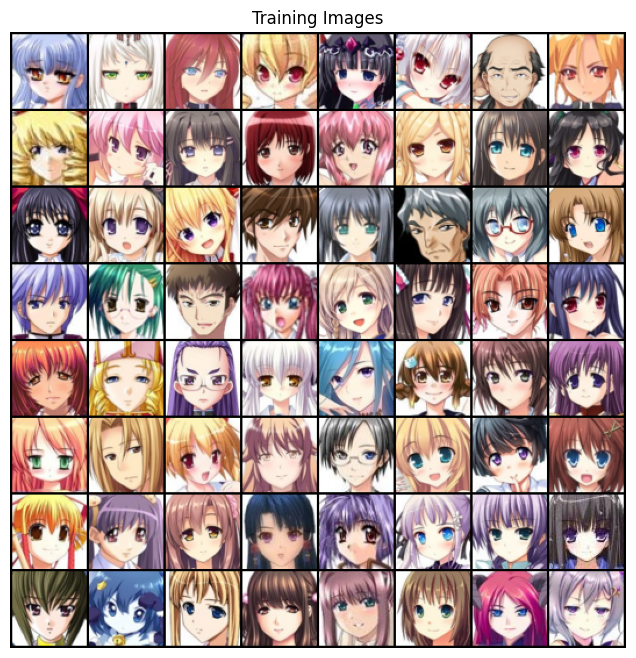

In [ ]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## Implementación

Una vez establecidos los parámetros de entrada y preparado el conjunto de datos, podemos pasar a la implementación. Empezaremos con la estrategia de inicialización del peso, luego hablaremos del generador, discriminador, funciones de pérdida y bucle de entrenamiento en detalle.

## INICIALIZACIÓN DE PESOS

From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. The <b>weights_init</b> function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization.

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Ahora que todas las partes de preprocesamiento se han completado, se va a comenzar con la construcción del modelo

<div class="section" id="generator">
<h3>Generator<a class="headerlink" href="#generator" title="Permalink to this headline"></a></h3>
<p>The generator part of a GAN learns to create fake data by incorporating feedback from the discriminator. It learns to make the discriminator classify its output as real.   
The generator, <span class="math notranslate nohighlight">$(G)$</span>, is designed to map the latent space vector
(<span class="math notranslate nohighlight">\(z\)</span>) to data-space. Since our data are images, converting
<span class="math notranslate nohighlight">\(z\)</span> to data-space means ultimately creating a RGB image with the
same size as the training images (i.e. 3x64x64). In practice, this is
accomplished through a series of strided two dimensional convolutional
transpose layers, each paired with a 2d batch norm layer and a relu
activation. The output of the generator is fed through a tanh function
to return it to the input data range of <span class="math notranslate nohighlight">\([-1,1]\)</span>. It is worth
noting the existence of the batch norm functions after the
conv-transpose layers, as this is a critical contribution of the DCGAN
paper. These layers help with the flow of gradients during training. An
image of the generator from the DCGAN paper is shown below.</p>

<div class="figure">
<img alt="dcgan_generator" src="https://pytorch.org/tutorials/_images/dcgan_generator.png"/>
</div>
    
<p>Notice, the how the inputs we set in the input section (<em>nz</em>, <em>ngf</em>, and
<em>nc</em>) influence the generator architecture in code. <em>nz</em> is the length
of the z input vector, <em>ngf</em> relates to the size of the feature maps
that are propagated through the generator, and <em>nc</em> is the number of
channels in the output image (set to 3 for RGB images).</p>

<p><b>Generator Code:</b></p>

In [ ]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution

            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8

            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16

            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32

            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

- <p><b>Ahora, se puede instanciar el generador y aplicar la función <code class="docutils literal notranslate"><span class="pre">weights_init</span></code>

- Observar el modelo impreso para ver cómo está estructurado el objeto generador.</b></p>

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


<div class="section" id="discriminator">
<h3>Discriminator<a class="headerlink" href="#discriminator" title="Permalink to this headline"></a></h3>
<p>As mentioned, the discriminator, <span class="math notranslate nohighlight">$(D)$</span>, is a binary classification
network that takes an image as input and outputs a scalar probability
that the input image is real (as opposed to fake). Here, <span class="math notranslate nohighlight">\(D\)</span> takes
a 3x64x64 input image, processes it through a series of Conv2d,
BatchNorm2d, and LeakyReLU layers, and outputs the final probability
through a Sigmoid activation function. This architecture can be extended
with more layers if necessary for the problem, but there is significance
to the use of the strided convolution, BatchNorm, and LeakyReLUs. The
DCGAN paper mentions it is a good practice to use strided convolution
rather than pooling to downsample because it lets the network learn its
own pooling function. Also batch norm and leaky relu functions promote
healthy gradient flow which is critical for the learning process of both
<span class="math notranslate nohighlight">\(G\)</span> and <span class="math notranslate nohighlight">\(D\)</span>.</p>

<div class="figure">
<img alt="dcgan_discriminator" src="https://miro.medium.com/max/924/1*Sa16hNLBZEP_7_B8M9M8bA.png"/>
</div>

<p><b>Discriminator Code :</b></p>

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

<p><b>Ahora, al igual aplicando la función <code class="docutils literal notranslate"><span class="pre">weights_init</span></code> , e imprimniendo la estructura del modelo.</b></p>

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


<div class="section" id="loss-functions-and-optimizers">
<h3>Loss Functions and Optimizers<a class="headerlink" href="#loss-functions-and-optimizers" title="Permalink to this headline"></a></h3>
<p>With <span class="math notranslate nohighlight">$(D)$</span> and <span class="math notranslate nohighlight">$(G)$</span> setup, we can specify how they learn
through the loss functions and optimizers. We will use the Binary Cross
Entropy loss function which is defined in PyTorch as:</p>
<div class="math notranslate nohighlight">

$$\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]$$</div>
<p>Notice how this function provides the calculation of both log components
in the objective function (i.e. <span class="math notranslate nohighlight">\(log(D(x))\)</span> and
<span class="math notranslate nohighlight">\(log(1-D(G(z)))\)</span>). We can specify what part of the BCE equation to
use with the <span class="math notranslate nohighlight">\(y\)</span> input. This is accomplished in the training loop
which is coming up soon, but it is important to understand how we can
choose which component we wish to calculate just by changing <span class="math notranslate nohighlight">\(y\)</span>
(i.e. GT labels).</p>
<p>Next, we define our real label as 1 and the fake label as 0. These
labels will be used when calculating the losses of <span class="math notranslate nohighlight">\(D\)</span> and
<span class="math notranslate nohighlight">\(G\)</span>, and this is also the convention used in the original GAN
paper. Finally, we set up two separate optimizers, one for <span class="math notranslate nohighlight">\(D\)</span> and
one for <span class="math notranslate nohighlight">\(G\)</span>. As specified in the DCGAN paper, both are Adam
optimizers with learning rate 0.0002 and Beta1 = 0.5. For keeping track
of the generator’s learning progression, we will generate a fixed batch
of latent vectors that are drawn from a Gaussian distribution
(i.e. fixed_noise) . In the training loop, we will periodically input
this fixed_noise into <span class="math notranslate nohighlight">\(G\)</span>, and over the iterations we will see
images form out of the noise.</p>

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

<h3>Training<a class="headerlink" href="#training" title="Permalink to this headline"></a></h3>
<p>Finally, now that we have all of the parts of the GAN framework defined,
we can train it. Be mindful that training GANs is somewhat of an art
form, as incorrect hyperparameter settings lead to mode collapse with
little explanation of what went wrong. Here, we will closely follow
Algorithm 1 from Goodfellow’s paper, while abiding by some of the best
practices shown in the DCGAN paper.
Namely, we will “construct different mini-batches for real and fake”
images, and also adjust G’s objective function to maximize
<span class="math notranslate nohighlight">$logD(G(z))$</span>. Training is split up into two main parts. <b>Part 1</b>
    updates the Discriminator and <b>Part 2</b> updates the Generator.</p>
    
<img src="https://miro.medium.com/max/1600/1*6svU8runkDRjyiIvZ6VKMw.gif">


<p><strong>Part 1 - Train the Discriminator</strong></p>
<p>Recall, the goal of training the discriminator is to maximize the
probability of correctly classifying a given input as real or fake. In
terms of Goodfellow, we wish to “update the discriminator by ascending
its stochastic gradient”. Practically, we want to maximize
<span class="math notranslate nohighlight">$log(D(x)) + log(1-D(G(z)))$</span>. We will calculate this in two steps. First, we
will construct a batch of real samples from the training set, forward
pass through <span class="math notranslate nohighlight">\(D\)</span>, calculate the loss (<span class="math notranslate nohighlight">\(log(D(x))\)</span>), then
calculate the gradients in a backward pass. Secondly, we will construct
a batch of fake samples with the current generator, forward pass this
batch through <span class="math notranslate nohighlight">\(D\)</span>, calculate the loss (<span class="math notranslate nohighlight">\(log(1-D(G(z)))\)</span>),
and <em>accumulate</em> the gradients with a backward pass. Now, with the
gradients accumulated from both the all-real and all-fake batches, we
call a step of the Discriminator’s optimizer i.e, update it's weights.</p>

<img src="https://developers.google.com/machine-learning/gan/images/gan_diagram_discriminator.svg">


<h3> To summarize</h3>

During the discriminator training:
   * The discriminator classifies both real data and fake data from the generator
   * We find the BCE loss between:
       * real data and real label
       * fake data and fake label
   * The discriminator loss penalzes the discriminator for misclassifying a real instance as fake or a fake instance as real.
   * The discriminator updates its weights through back propagation from the discriminator loss through the discriminator network

<p><strong>Part 2 - Train the Generator</strong></p>
<p>As stated in the original paper, we want to train the Generator by
minimizing <span class="math notranslate nohighlight">$(log(1-D(G(z))))$</span> in an effort to generate better fakes.
As mentioned, this was shown by Goodfellow to not provide sufficient
gradients, especially early in the learning process. As a fix, we
instead wish to maximize <span class="math notranslate nohighlight">$(log(D(G(z))))$</span>. In the code we accomplish
this by: classifying the Generator output from Part 1 with the
Discriminator, computing G’s loss <em>using real labels as GT</em>, computing
G’s gradients in a backward pass, and finally updating G’s parameters
with an optimizer step. It may seem counter-intuitive to use the real
labels as GT labels for the loss function, but this allows us to use the
<span class="math notranslate nohighlight">$(log(x))$</span> part of the BCELoss (rather than the <span class="math notranslate nohighlight">$(log(1-x))$</span>
part) which is exactly what we want.</p>
    
<img src = "https://developers.google.com/machine-learning/gan/images/gan_diagram_generator.svg">

<h3>Resumen:</h3>

   * Muestrear el vector de ruido aleatorio
   * Producir la salida del generador a partir de la clasificación muestreada para el generador
   * Pasar la salida generada a través del Discriminator como "Real" or "Fake"
   * Calcular la loss BCE entre <b>generated data</b> y <b>real    
   * Retropropagación a través del discriminador y el generador para obtener gradientes.
   * Utilizar gradientes para cambiar sólo los pesos del generador.

- <p>Finalmente, se visualizará de manera gráfica algunos datos estadísticos y al final de cada época se pasará el batch de ruido fijo por el generador para seguir visualmente el progreso del entrenamiento de G.
- Las estadísticas de formación reportados son:</p>
<ul class="simple">
<li><strong>Loss_D</strong> - discriminator loss calculated as the sum of losses for
the all real and all fake batches (<span class="math notranslate nohighlight">$(log(D(x)) + log(D(G(z))))$</span>).</li>
<li><strong>Loss_G</strong> - generator loss calculated as <span class="math notranslate nohighlight">\(log(D(G(z)))\)</span></li>
<li><strong>D(x)</strong> - the average output (across the batch) of the discriminator
for the all real batch. This should start close to 1 then
theoretically converge to 0.5 when G gets better.</li>
<li><strong>D(G(z))</strong> - average discriminator outputs for the all fake batch.
The first number is before D is updated and the second number is
after D is updated. These numbers should start near 0 and converge to 0.5 as G gets better.</li>
</ul>

In [ ]:

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(tqdm(dataloader, 0)):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1


Starting Training Loop...


  0%|          | 0/496 [00:00<?, ?it/s]

[0/5][0/496]	Loss_D: 1.5542	Loss_G: 5.1041	D(x): 0.5919	D(G(z)): 0.5501 / 0.0097
[0/5][50/496]	Loss_D: 0.2985	Loss_G: 5.7396	D(x): 0.9452	D(G(z)): 0.1539 / 0.0174
[0/5][100/496]	Loss_D: 0.6825	Loss_G: 4.8474	D(x): 0.7544	D(G(z)): 0.1852 / 0.0115
[0/5][150/496]	Loss_D: 0.7875	Loss_G: 5.1770	D(x): 0.6631	D(G(z)): 0.0132 / 0.0080
[0/5][200/496]	Loss_D: 0.5035	Loss_G: 7.1718	D(x): 0.8554	D(G(z)): 0.1970 / 0.0024
[0/5][250/496]	Loss_D: 0.5174	Loss_G: 4.8330	D(x): 0.7258	D(G(z)): 0.0200 / 0.0145
[0/5][300/496]	Loss_D: 0.7115	Loss_G: 4.9228	D(x): 0.6349	D(G(z)): 0.0411 / 0.0177
[0/5][350/496]	Loss_D: 0.3579	Loss_G: 5.0517	D(x): 0.8056	D(G(z)): 0.0600 / 0.0106
[0/5][400/496]	Loss_D: 0.3997	Loss_G: 5.4549	D(x): 0.7912	D(G(z)): 0.0065 / 0.0084
[0/5][450/496]	Loss_D: 0.6702	Loss_G: 7.3620	D(x): 0.9221	D(G(z)): 0.3875 / 0.0016


  0%|          | 0/496 [00:00<?, ?it/s]

[1/5][0/496]	Loss_D: 1.2558	Loss_G: 9.0562	D(x): 0.9236	D(G(z)): 0.5887 / 0.0003
[1/5][50/496]	Loss_D: 1.0632	Loss_G: 9.5541	D(x): 0.5427	D(G(z)): 0.0018 / 0.0002
[1/5][100/496]	Loss_D: 0.5640	Loss_G: 6.3983	D(x): 0.8507	D(G(z)): 0.2667 / 0.0026
[1/5][150/496]	Loss_D: 0.7337	Loss_G: 5.7916	D(x): 0.7898	D(G(z)): 0.2982 / 0.0076
[1/5][200/496]	Loss_D: 0.8391	Loss_G: 4.7025	D(x): 0.5720	D(G(z)): 0.0087 / 0.0173
[1/5][250/496]	Loss_D: 0.8468	Loss_G: 6.8712	D(x): 0.8195	D(G(z)): 0.3800 / 0.0021
[1/5][300/496]	Loss_D: 0.7432	Loss_G: 9.2768	D(x): 0.9263	D(G(z)): 0.4305 / 0.0002
[1/5][350/496]	Loss_D: 1.9464	Loss_G: 12.0714	D(x): 0.9288	D(G(z)): 0.8042 / 0.0000
[1/5][400/496]	Loss_D: 0.8560	Loss_G: 9.5858	D(x): 0.8819	D(G(z)): 0.4572 / 0.0002
[1/5][450/496]	Loss_D: 0.3465	Loss_G: 5.1340	D(x): 0.8394	D(G(z)): 0.1246 / 0.0088


  0%|          | 0/496 [00:00<?, ?it/s]

[2/5][0/496]	Loss_D: 0.5200	Loss_G: 4.8303	D(x): 0.7830	D(G(z)): 0.1407 / 0.0127
[2/5][50/496]	Loss_D: 0.3673	Loss_G: 3.6073	D(x): 0.7693	D(G(z)): 0.0265 / 0.0526
[2/5][100/496]	Loss_D: 0.6800	Loss_G: 4.4084	D(x): 0.6437	D(G(z)): 0.0353 / 0.0189
[2/5][150/496]	Loss_D: 0.7890	Loss_G: 4.6081	D(x): 0.5737	D(G(z)): 0.0059 / 0.0159
[2/5][200/496]	Loss_D: 0.5754	Loss_G: 6.1999	D(x): 0.8583	D(G(z)): 0.2786 / 0.0033
[2/5][250/496]	Loss_D: 1.4793	Loss_G: 13.6012	D(x): 0.9171	D(G(z)): 0.6878 / 0.0000
[2/5][300/496]	Loss_D: 0.4730	Loss_G: 5.8328	D(x): 0.8598	D(G(z)): 0.2264 / 0.0057
[2/5][350/496]	Loss_D: 1.1758	Loss_G: 9.8830	D(x): 0.9812	D(G(z)): 0.6107 / 0.0002
[2/5][400/496]	Loss_D: 0.3530	Loss_G: 4.5662	D(x): 0.8422	D(G(z)): 0.1260 / 0.0154
[2/5][450/496]	Loss_D: 0.8449	Loss_G: 4.3901	D(x): 0.5605	D(G(z)): 0.0088 / 0.0214


  0%|          | 0/496 [00:00<?, ?it/s]

[3/5][0/496]	Loss_D: 1.2762	Loss_G: 7.0536	D(x): 0.4287	D(G(z)): 0.0001 / 0.0016
[3/5][50/496]	Loss_D: 0.4531	Loss_G: 3.5144	D(x): 0.7254	D(G(z)): 0.0466 / 0.0449
[3/5][100/496]	Loss_D: 0.3125	Loss_G: 5.9848	D(x): 0.8940	D(G(z)): 0.1526 / 0.0042
[3/5][150/496]	Loss_D: 0.3538	Loss_G: 5.6436	D(x): 0.9152	D(G(z)): 0.1993 / 0.0063
[3/5][200/496]	Loss_D: 0.3999	Loss_G: 4.1953	D(x): 0.7500	D(G(z)): 0.0371 / 0.0285
[3/5][250/496]	Loss_D: 0.3112	Loss_G: 4.7887	D(x): 0.8150	D(G(z)): 0.0494 / 0.0145
[3/5][300/496]	Loss_D: 0.2971	Loss_G: 5.9328	D(x): 0.8624	D(G(z)): 0.0905 / 0.0053
[3/5][350/496]	Loss_D: 0.3986	Loss_G: 5.1250	D(x): 0.7431	D(G(z)): 0.0098 / 0.0099
[3/5][400/496]	Loss_D: 0.1652	Loss_G: 3.4912	D(x): 0.9298	D(G(z)): 0.0761 / 0.0616
[3/5][450/496]	Loss_D: 0.7976	Loss_G: 10.5032	D(x): 0.9967	D(G(z)): 0.4432 / 0.0001


  0%|          | 0/496 [00:00<?, ?it/s]

[4/5][0/496]	Loss_D: 0.2535	Loss_G: 5.8200	D(x): 0.9231	D(G(z)): 0.1353 / 0.0052
[4/5][50/496]	Loss_D: 0.2361	Loss_G: 4.9956	D(x): 0.9111	D(G(z)): 0.1123 / 0.0113
[4/5][100/496]	Loss_D: 0.7204	Loss_G: 9.1912	D(x): 0.9873	D(G(z)): 0.4330 / 0.0004
[4/5][150/496]	Loss_D: 0.3859	Loss_G: 6.4541	D(x): 0.9608	D(G(z)): 0.2498 / 0.0029
[4/5][200/496]	Loss_D: 0.1811	Loss_G: 3.4266	D(x): 0.9289	D(G(z)): 0.0818 / 0.0572
[4/5][250/496]	Loss_D: 0.1499	Loss_G: 6.5293	D(x): 0.9181	D(G(z)): 0.0384 / 0.0033
[4/5][300/496]	Loss_D: 0.3150	Loss_G: 4.5134	D(x): 0.8454	D(G(z)): 0.0637 / 0.0185
[4/5][350/496]	Loss_D: 0.2248	Loss_G: 4.9672	D(x): 0.8833	D(G(z)): 0.0757 / 0.0121
[4/5][400/496]	Loss_D: 0.3458	Loss_G: 5.7983	D(x): 0.8753	D(G(z)): 0.1604 / 0.0054
[4/5][450/496]	Loss_D: 0.2063	Loss_G: 6.4087	D(x): 0.9427	D(G(z)): 0.1214 / 0.0031


<div class="section" id="results">
<h2>Resultados<a class="headerlink" href="#results" title="Permalink to this headline"></a></h2>
<p>Por último, se visualiza cómo ha sido el resultado, considerando los siguientes tres tipos de resultados diferentes.</p>
    
* Primero, ver cómo cambian las pérdidas de D y G durante el entrenamiento.
    
* Segundo, visualizar la salida de G en el lote de ruido fijo para cada época.
    
* Tercero, ver un batch de datos reales junto a un batch de datos falsos de G.


<p><strong>Loss versus training iteration</strong></p>
<p>Gráfico de la loss de D &amp; G’s vs iteraciones de entrenamiento.</p>


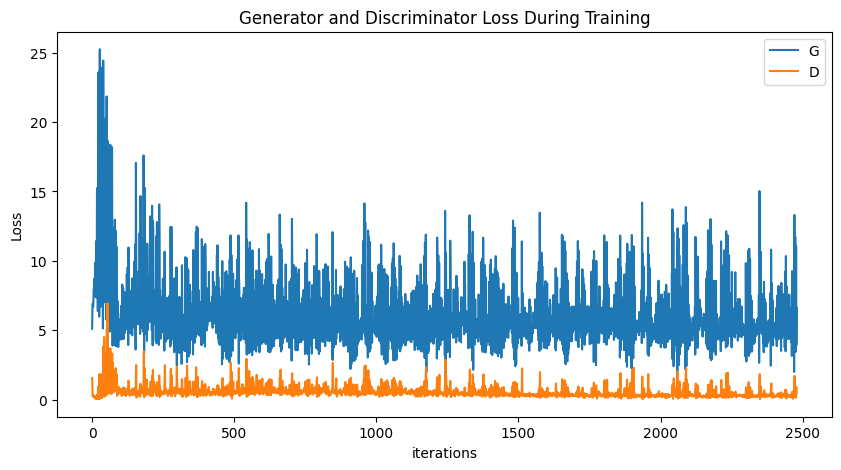

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

<p><strong>Visualización de la progresión G’s </strong></p>

 - Se guarda la salida del generador después de cada epoch generando un lote de imágenes a partir de un vector de ruido fijo.
 - Luego se visualiza la progresión del Generador

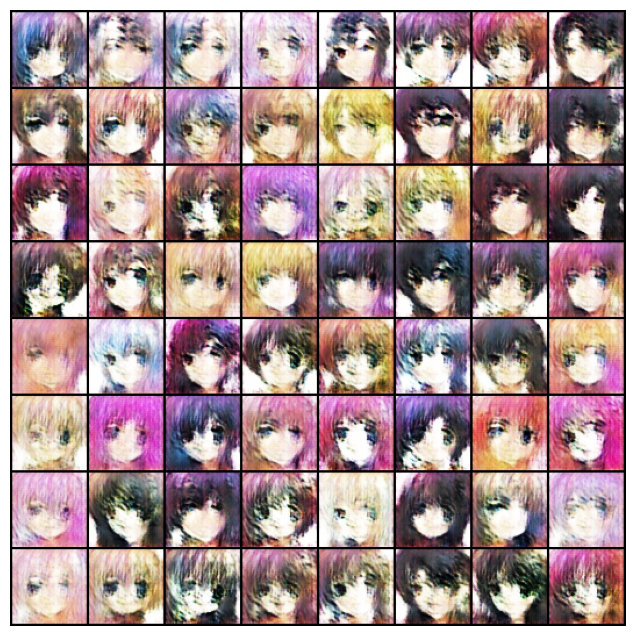

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

<p><strong>Real Images vs. Fake Images</strong></p>
<p>Por último, se visualizan algunas imágenes reales y otras falsas.</p>

In [ ]:
import torchvision.utils as vutils

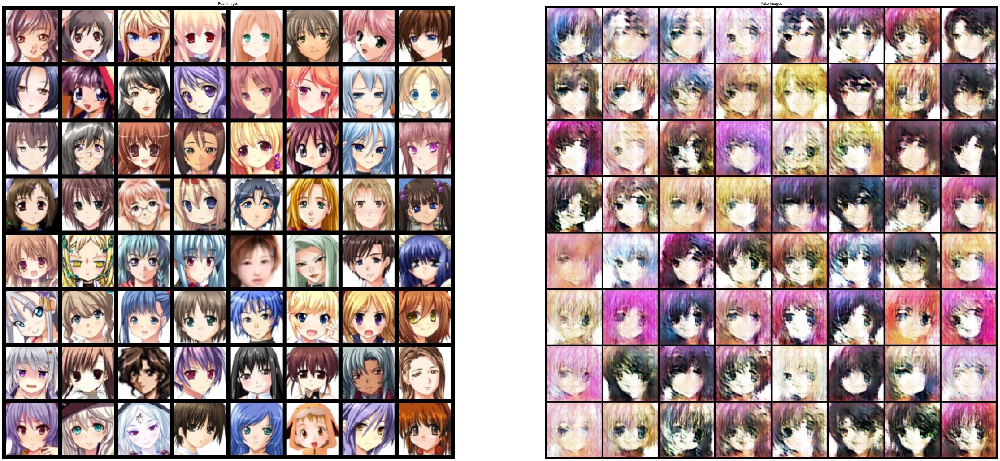

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(64,64))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()